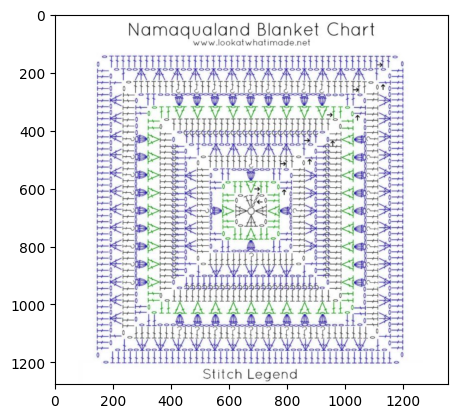

In [1]:
import cv2 as cv
import matplotlib.pyplot as plt
import numpy as np
import math

img = cv.imread('data/raw/img/1.png')
plt.imshow(img)

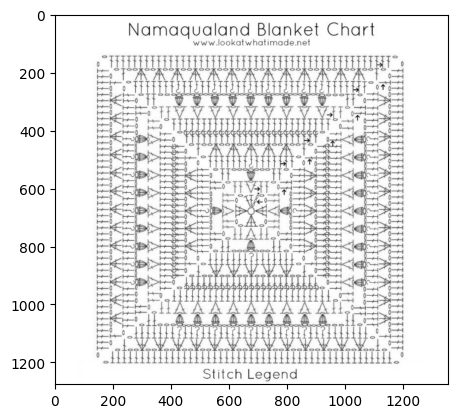

In [2]:
gray_img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
plt.imshow(gray_img, cmap='gray')

In [3]:
# Create mask for granny square. We need to parse only the top quarter triangle of the image, so we can ignore the rest.
#mask = np.zeros(gray_img.shape, dtype=np.uint8)
#h, w = gray_img.shape
#pts = np.tril(np.array([[0, 0], [w, 0], [w // 2, h // 2]]))
#cv.fillPoly(mask, [pts], 255)
#plt.imshow(mask, cmap='gray')

In [4]:
#masked_img = cv.bitwise_and(gray_img, gray_img, mask=mask)
#plt.imshow(masked_img, cmap='gray')
masked_img = gray_img

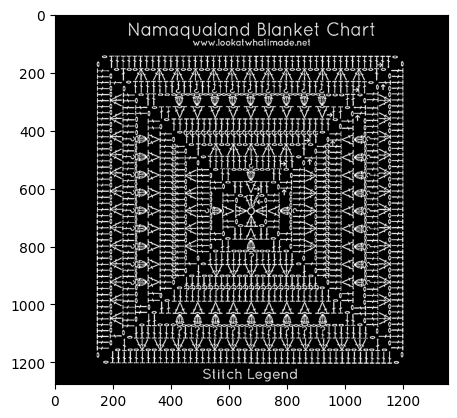

In [5]:
denoised = cv.fastNlMeansDenoising(masked_img, h=10, templateWindowSize=7,
                                         searchWindowSize=21)

thresh1 = cv.adaptiveThreshold(
        denoised, 255,
        cv.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv.THRESH_BINARY_INV,
        blockSize=19, C=4
    )
plt.imshow(thresh1, cmap='gray')

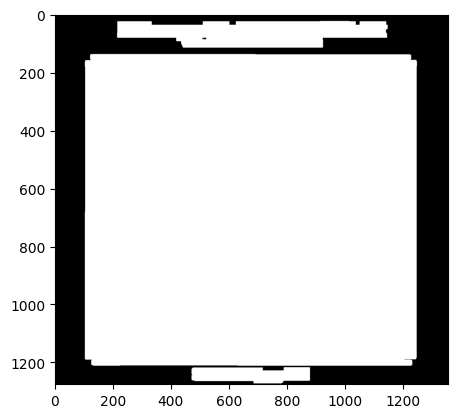

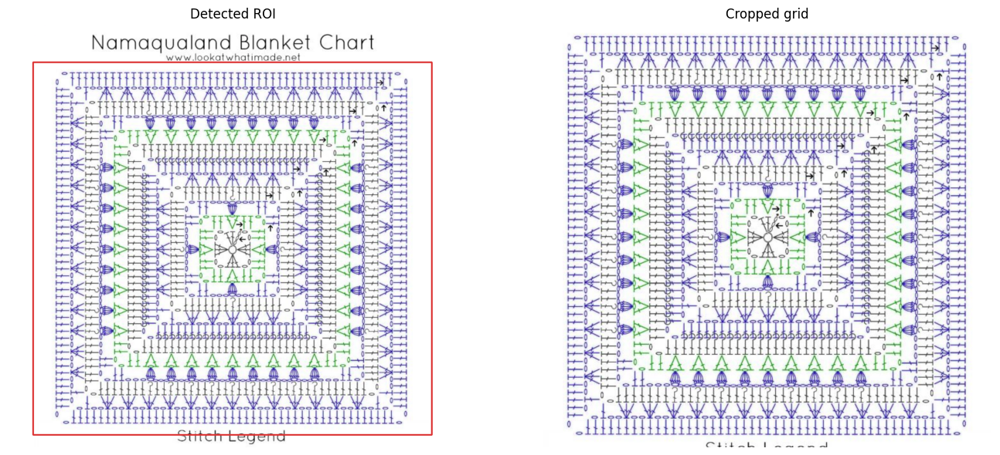

ROI: (76, 113, 1200, 1125)


In [6]:
def find_stitch_roi(binary: np.ndarray,
                    min_fill_ratio: float = 0.05,
                    margin_frac: float = 0.02) -> tuple[int,int,int,int]:
    """
    Locate the bounding box of the densest connected region (the stitch grid).
    Returns (x, y, w, h) in pixel coordinates.

    Strategy
    --------
    1. Dilate heavily so nearby symbols merge into blobs.
    2. Find the largest blob by area — that is the stitch grid.
    3. Return its bounding rectangle with a small margin.
    """

    kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (2, 2))
    cleaned = cv.morphologyEx(binary, cv.MORPH_OPEN, kernel, iterations=1)



    # 4. Close small gaps inside symbols
    kernel2 = cv.getStructuringElement(cv.MORPH_ELLIPSE, (3, 3))
    closed = cv.morphologyEx(cleaned, cv.MORPH_CLOSE, kernel2, iterations=1)


    # Dilate so all stitch symbols within a piece connect
    k = cv.getStructuringElement(cv.MORPH_RECT, (30, 5)) # TODO probably should be adaptive to image size, the width is bigger, because of the text
    dilated = cv.dilate(closed, k, iterations=3)
    
    plt.imshow(dilated, cmap='gray')

    
    # Find contours of merged blobs
    contours, _ = cv.findContours(dilated, cv.RETR_EXTERNAL,
                                    cv.CHAIN_APPROX_SIMPLE)
    if not contours:
        h, w = closed.shape
        return 0, 0, w, h

    # Pick the largest contour
    largest = max(contours, key=cv.contourArea)
    x, y, w, h = cv.boundingRect(largest)

    # Add margin
    H, W = closed.shape
    mx = int(W * margin_frac)
    my = int(H * margin_frac)
    x = max(0, x - mx);  y = max(0, y - my)
    w = min(W - x, w + 2*mx)
    h = min(H - y, h + 2*my)
    return x, y, w, h


def crop_roi(img_rgb, binary, roi):
    x, y, w, h = roi
    return img_rgb[y:y+h, x:x+w], binary[y:y+h, x:x+w]


roi = find_stitch_roi(thresh1)
roi_rgb, roi_bin = crop_roi(img, thresh1, roi)

# Visualise
vis = img.copy()
x,y,w,h = roi
cv.rectangle(vis, (x,y), (x+w,y+h), (220,50,50), 4)
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(vis);     axes[0].set_title('Detected ROI'); axes[0].axis('off')
axes[1].imshow(roi_rgb); axes[1].set_title('Cropped grid'); axes[1].axis('off')
plt.tight_layout(); plt.show()
print(f'ROI: {roi}')

In [7]:
def unwrap_square(image, output_size=(300, 800)):
    h, w = image.shape[:2]
    center_x, center_y = w // 2, h // 2
    
    # Create the destination grid
    out_h, out_w = output_size
    unwrapped = np.zeros((out_h, out_w, 3), dtype=np.uint8)
    
    # Map coordinates
    # theta goes from 0 to 2*pi
    # r goes from 0 to the "edge" of the square
    theta = np.linspace(0, 2 * np.pi, out_w)
    r_norm = np.linspace(0, 1, out_h)
    
    # Vectorized meshgrid for speed
    T, R = np.meshgrid(theta, r_norm)
    
    # The "Magic": Calculate the distance to the edge of a square at angle T
    # This prevents the stretching seen in linear polar transforms
    cos_t = np.abs(np.cos(T))
    sin_t = np.abs(np.sin(T))
    r_max = 0.5 * np.minimum(w / cos_t, h / sin_t)
    
    # Calculate actual source pixel positions
    actual_r = R * r_max
    src_x = center_x + actual_r * np.cos(T)
    src_y = center_y + actual_r * np.sin(T)
    
    # Use remap to interpolate the pixels
    unwrapped = cv.remap(image, src_x.astype(np.float32), src_y.astype(np.float32), 
                          interpolation=cv.INTER_LINEAR)
    
    return unwrapped

# Usage
roi_rgb = unwrap_square(roi_rgb)

/var/folders/b5/4hk8xrkx3x50b85sdqdmy76w0000gn/T/ipykernel_19267/1937163481.py:22: RuntimeWarning: divide by zero encountered in divide
  r_max = 0.5 * np.minimum(w / cos_t, h / sin_t)


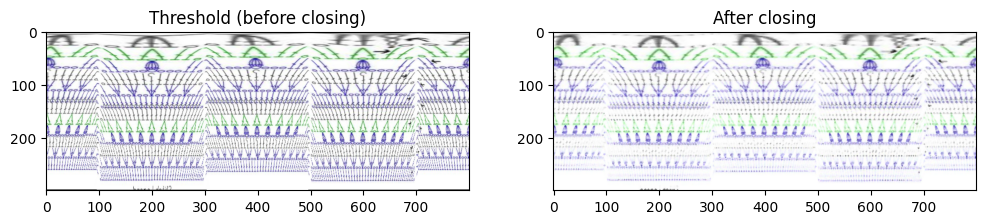

In [8]:
# Invert threshold: white symbols on black background (required for correct morphological closing)
#thresh_inv = cv.bitwise_not(thresh1)

# Close small gaps in broken circle outlines
# Now closing expands white symbol lines to bridge gaps, not the background
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (3, 3))
closed = cv.morphologyEx(roi_rgb, cv.MORPH_CLOSE, kernel)

# Compare before and after
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
ax1.imshow(roi_rgb, cmap='gray'); ax1.set_title('Threshold (before closing)')
ax2.imshow(closed, cmap='gray');    ax2.set_title('After closing')
plt.show()

In [9]:
contours, hierarchy = cv.findContours(roi_bin, cv.RETR_TREE, cv.CHAIN_APPROX_SIMPLE)

In [10]:
def get_shape_features(c):
    x, y, w, h = cv.boundingRect(c)
    aspect_ratio = w / h                                                          # circles ≈ 1.0, tall stitches << 1
    area = cv.contourArea(c)
    perimeter = cv.arcLength(c, True)
    circularity = (4 * np.pi * area / (perimeter ** 2)) if perimeter > 0 else 0  # circles ≈ 1.0
    return aspect_ratio, circularity, area

# Print all contours so we can tune thresholds
print(f"{'i':>4}  {'area':>8}  {'aspect_ratio':>12}  {'circularity':>12}")
print("-" * 45)
for i, c in enumerate(contours):
    ar, circ, area = get_shape_features(c)
    print(f"{i:>4}  {area:>8.0f}  {ar:>12.3f}  {circ:>12.3f}")

slip_stitch_contours = []
for c in contours:
    aspect_ratio, circularity, area = get_shape_features(c)
    if (
        0.5 < aspect_ratio < 2.0 and  # roughly as wide as tall
        circularity > 0.55 and         # reasonably round (not a bar or tick)
        100 < area < 8000              # large enough to be a real symbol
    ):
        slip_stitch_contours.append(c)

print(f"\nSlip stitches found: {len(slip_stitch_contours)}")

   i      area  aspect_ratio   circularity
---------------------------------------------
   0        39         4.500         0.299
   1        32         4.250         0.317
   2        40         5.250         0.219
   3        32         4.250         0.303
   4        35         4.500         0.297
   5         9         1.000         0.785
   6         9         1.000         0.785
   7         0         1.000         0.000
   8        64         1.357         0.190
   9        42         0.857         0.271
  10        44         0.786         0.299
  11        70         1.714         0.151
  12        64         1.400         0.156
  13        36         0.333         0.399
  14       114         2.000         0.735
  15        34         2.400         0.667
  16       123         1.900         0.737
  17        40         2.600         0.654
  18       116         0.500         0.725
  19        42         0.500         0.730
  20       116         0.474         0.699
  21    

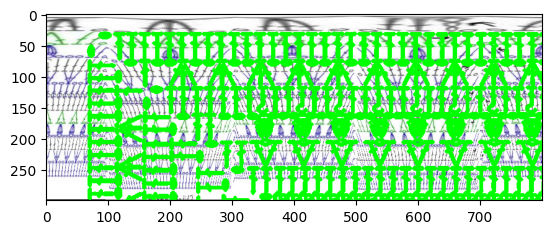

In [11]:
# Draw contours on the original image
img_contours = roi_rgb.copy()
cv.drawContours(img_contours, contours, -1, (0, 255, 0), 3)
plt.imshow(img_contours)

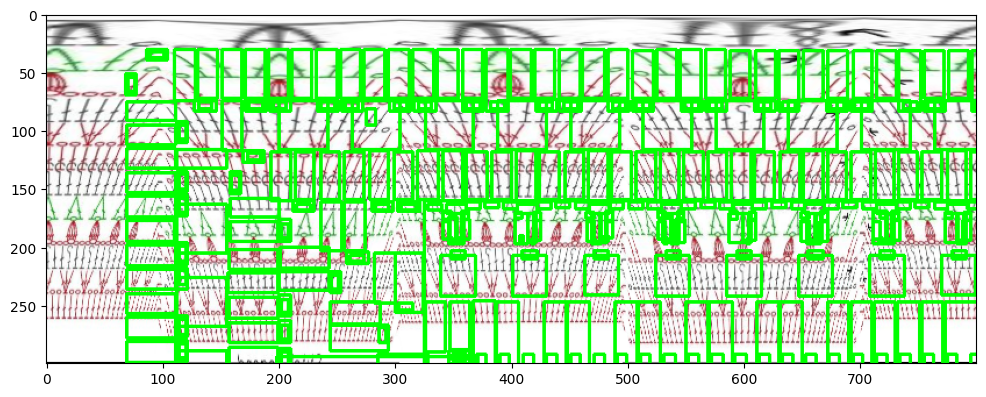

In [12]:
#debug_img = cv.cvtColor(gray_img, cv.COLOR_GRAY2BGR)
for c in contours:
    x, y, w, h = cv.boundingRect(c)
    cv.rectangle(roi_rgb, (x, y), (x+w, y+h), (0, 255, 0), 2)
    
plt.figure(figsize=(12, 12))
plt.imshow(cv.cvtColor(roi_rgb, cv.COLOR_BGR2RGB))
plt.show()

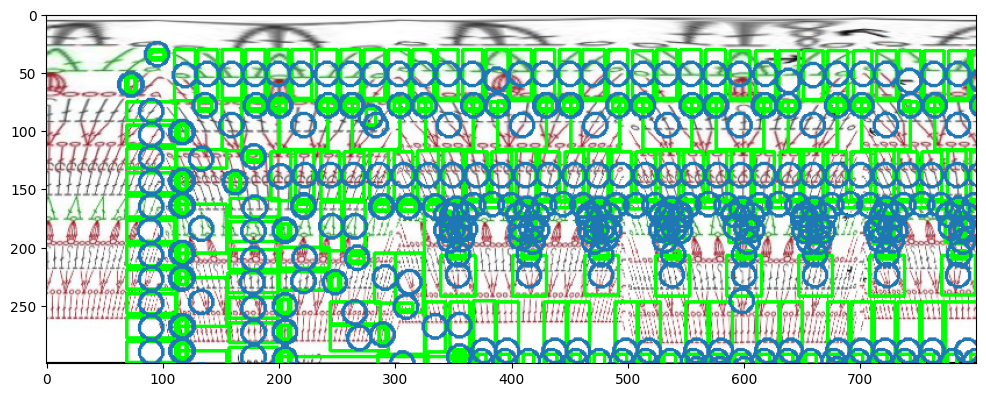

In [13]:
# Cluster contours by their vertical position to group them into rows
contour_centers = [cv.boundingRect(c) for c in contours]
contour_centers = [(x + w/2, y + h/2) for x, y, w, h in contour_centers]
contour_centers = sorted(contour_centers, key=lambda c: c[1])
row_groups = []
current_row = []
row_threshold = 20  # pixels
for center in contour_centers:
    if not current_row:
        current_row.append(center)
    else:
        _, last_y = current_row[-1]
        _, y = center
        if abs(y - last_y) < row_threshold:
            current_row.append(center)
        else:
            row_groups.append(current_row)
            current_row = [center]
if current_row:
    row_groups.append(current_row)  

# Visualisation
colors = plt.cm.tab10.colors
overlay = cv.cvtColor(roi_rgb.copy(), cv.COLOR_BGR2RGB)
for row_idx, group in enumerate(row_groups):
    color_bgr = tuple(int(c * 255) for c in colors[row_idx % len(colors)][:3])
    for center in group:
        x, y = int(center[0]), int(center[1])
        cv.circle(overlay, (x, y), 10, color_bgr, 2)

plt.figure(figsize=(12, 12))
plt.imshow(overlay)
plt.show()

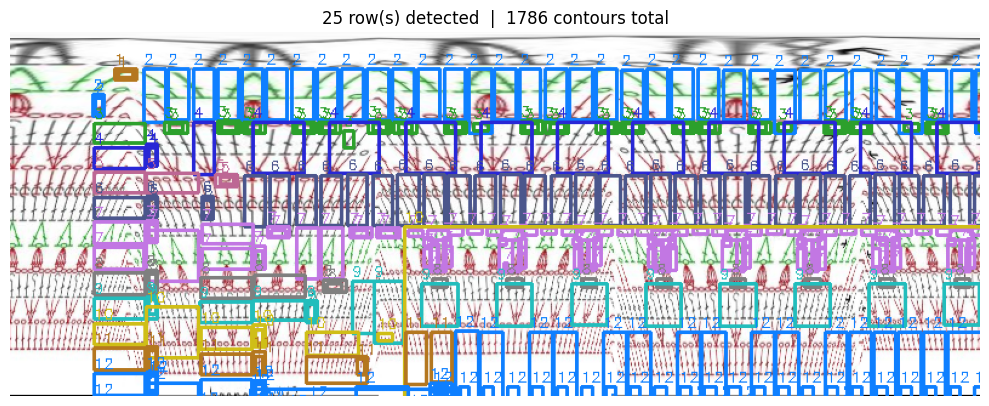

  Row 1: 4 symbol(s)
  Row 2: 51 symbol(s)
  Row 3: 58 symbol(s)
  Row 4: 21 symbol(s)
  Row 5: 8 symbol(s)
  Row 6: 49 symbol(s)
  Row 7: 140 symbol(s)
  Row 8: 23 symbol(s)
  Row 9: 27 symbol(s)
  Row 10: 15 symbol(s)
  Row 11: 19 symbol(s)
  Row 12: 758 symbol(s)
  Row 13: 79 symbol(s)
  Row 14: 123 symbol(s)
  Row 15: 20 symbol(s)
  Row 16: 15 symbol(s)
  Row 17: 27 symbol(s)
  Row 18: 20 symbol(s)
  Row 19: 144 symbol(s)
  Row 20: 49 symbol(s)
  Row 21: 20 symbol(s)
  Row 22: 47 symbol(s)
  Row 23: 51 symbol(s)
  Row 24: 4 symbol(s)
  Row 25: 14 symbol(s)

Granny square rows detected: 25


In [14]:
def count_rows_from_contours(contours, gap_factor=0.5):
    """
    Count stitch rows by clustering contour bounding boxes by their y-position.

    Contours belonging to the same row have similar y-centres.
    A gap larger than gap_factor * median_height between consecutive
    y-centres means we've crossed into a new row.

    Args:
        contours:    list of OpenCV contours
        gap_factor:  gap threshold as a fraction of the median symbol height.
                     Increase if rows are being merged; decrease if one row
                     is being split into multiple.

    Returns:
        n_rows:      number of detected rows
        row_groups:  list of lists — each inner list holds the contour indices
                     belonging to that row, top to bottom
    """
    if not contours:
        return 0, []

    # Collect (y_centre, height, original_index) for every contour
    boxes = []
    for i, c in enumerate(contours):
        x, y, w, h = cv.boundingRect(c)
        y_centre = y + h / 2
        boxes.append((y_centre, h, i))

    # Sort by y_centre top → bottom
    boxes.sort(key=lambda b: b[0])
    y_centres = np.array([b[0] for b in boxes])
    heights   = np.array([b[1] for b in boxes])

    median_h  = np.median(heights)
    min_gap   = gap_factor * median_h

    # Gap-based clustering: a jump larger than min_gap starts a new row
    row_groups = []
    current_row = [boxes[0][2]]

    for i in range(1, len(boxes)):
        gap = y_centres[i] - y_centres[i - 1]
        if gap > min_gap:
            row_groups.append(current_row)
            current_row = []
        current_row.append(boxes[i][2])
    row_groups.append(current_row)

    n_rows = len(row_groups)

    # ── Visualisation ────────────────────────────────────────────────
    colors = plt.cm.tab10.colors
    overlay = cv.cvtColor(roi_rgb.copy(), cv.COLOR_BGR2RGB)

    for row_idx, group in enumerate(row_groups):
        color_bgr = tuple(int(c * 255) for c in colors[row_idx % len(colors)][:3])
        for ci in group:
            x, y, w, h = cv.boundingRect(contours[ci])
            cv.rectangle(overlay, (x, y), (x + w, y + h), color_bgr[::-1], 2)
            cv.putText(overlay, str(row_idx + 1), (x, y - 4),
                       cv.FONT_HERSHEY_SIMPLEX, 0.4, color_bgr[::-1], 1)

    plt.figure(figsize=(10, 10))
    plt.imshow(overlay)
    plt.title(f"{n_rows} row(s) detected  |  {len(contours)} contours total")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    for i, group in enumerate(row_groups):
        print(f"  Row {i + 1}: {len(group)} symbol(s)")

    return n_rows, row_groups


n_rows, row_groups = count_rows_from_contours(contours)
print(f"\nGranny square rows detected: {n_rows}")

In [15]:
from dataclasses import dataclass

@dataclass
class SymbolCrop:
    image: np.ndarray        # grayscale crop
    row: int                 # 1-based row index (top = 1)
    col: int                 # 1-based position within the row (left = 1)
    bbox: tuple              # (x, y, w, h) in original image coordinates


def iter_symbols(gray, contours, row_groups, padding=4):
    """
    Yield SymbolCrop objects in reading order: top row first,
    left to right within each row.

    Args:
        gray:        grayscale source image to crop from
        contours:    list of OpenCV contours (output of findContours)
        row_groups:  list of lists of contour indices, grouped by row
                     (output of count_rows_from_contours)
        padding:     px of padding added around each bounding box

    Yields:
        SymbolCrop, one per detected symbol in order
    """
    h_img, w_img = gray.shape

    for row_idx, group in enumerate(row_groups):
        # Sort contours within the row left → right by x of bounding box
        sorted_group = sorted(group, key=lambda ci: cv.boundingRect(contours[ci])[0])

        for col_idx, ci in enumerate(sorted_group):
            x, y, w, h = cv.boundingRect(contours[ci])

            # Apply padding, clamped to image bounds
            x1 = max(x - padding, 0)
            y1 = max(y - padding, 0)
            x2 = min(x + w + padding, w_img)
            y2 = min(y + h + padding, h_img)

            crop = gray[y1:y2, x1:x2]

            yield SymbolCrop(
                image=crop,
                row=row_idx + 1,
                col=col_idx + 1,
                bbox=(x, y, w, h),
            )


# ── Quick visual check ────────────────────────────────────────────────────────
roi_gray = cv.cvtColor(roi_rgb, cv.COLOR_BGR2GRAY)
symbols = list(iter_symbols(roi_gray, contours, row_groups))
print(f"Total symbols: {len(symbols)}")

# Show all crops in a grid, labelled by (row, col)
cols = 8
rows_grid = max(1, (len(symbols) + cols - 1) // cols)
fig, axes = plt.subplots(rows_grid, cols, figsize=(cols * 1.8, rows_grid * 2.2))
axes = axes.flatten() if hasattr(axes, 'flatten') else [axes]

for ax, sym in zip(axes, symbols):
    ax.imshow(sym.image, cmap='gray')
    ax.set_title(f"r{sym.row} c{sym.col}", fontsize=8)
    ax.axis('off')
for ax in axes[len(symbols):]:
    ax.axis('off')

plt.suptitle("Symbols in reading order (row, col)", y=1.01)
plt.tight_layout()
plt.show()

Total symbols: 1786


/var/folders/b5/4hk8xrkx3x50b85sdqdmy76w0000gn/T/ipykernel_19267/942280817.py:63: UserWarning: Attempting to set identical low and high xlims makes transformation singular; automatically expanding.
  ax.imshow(sym.image, cmap='gray')
/var/folders/b5/4hk8xrkx3x50b85sdqdmy76w0000gn/T/ipykernel_19267/942280817.py:63: UserWarning: Attempting to set identical low and high ylims makes transformation singular; automatically expanding.
  ax.imshow(sym.image, cmap='gray')


In [16]:
import sys, joblib
sys.path.insert(0, '.')
from classifier import SymbolClassifier

clf = SymbolClassifier.load("model.joblib")
print(f"Model loaded. Classes: {list(clf.label_encoder.classes_)}")

Model loaded. Classes: [np.str_('chain'), np.str_('double'), np.str_('noise'), np.str_('slip_stitch'), np.str_('treble')]


In [17]:
# Classify every symbol in reading order and attach the label to each SymbolCrop
from dataclasses import dataclass

@dataclass
class ClassifiedSymbol:
    image: np.ndarray
    row: int
    col: int
    bbox: tuple
    label: str
    confidence: float


classified = []
for sym in iter_symbols(gray_img, contours, row_groups):
    label = clf.predict(sym.image)
    proba = clf.predict_proba(sym.image)
    confidence = proba[label]
    classified.append(ClassifiedSymbol(
        image=sym.image,
        row=sym.row,
        col=sym.col,
        bbox=sym.bbox,
        label=label,
        confidence=confidence,
    ))

print(f"Classified {len(classified)} symbols")
print(f"\n{'Row':>4}  {'Col':>4}  {'Label':<15}  {'Conf':>5}")
print("-" * 35)
for s in classified:
    print(f"{s.row:>4}  {s.col:>4}  {s.label:<15}  {s.confidence:.2f}")

Classified 1786 symbols

 Row   Col  Label             Conf
-----------------------------------
   1     1  treble           0.51
   1     2  treble           0.51
   1     3  noise            0.56
   1     4  noise            0.56
   2     1  treble           0.51
   2     2  treble           0.51
   2     3  treble           0.51
   2     4  treble           0.51
   2     5  treble           0.51
   2     6  treble           0.51
   2     7  treble           0.51
   2     8  treble           0.51
   2     9  treble           0.51
   2    10  noise            0.67
   2    11  noise            0.73
   2    12  noise            0.53
   2    13  noise            0.73
   2    14  noise            0.57
   2    15  noise            0.65
   2    16  noise            0.78
   2    17  noise            0.58
   2    18  noise            0.81
   2    19  noise            0.71
   2    20  noise            0.86
   2    21  noise            0.84
   2    22  noise            0.69
   2    23  noise   

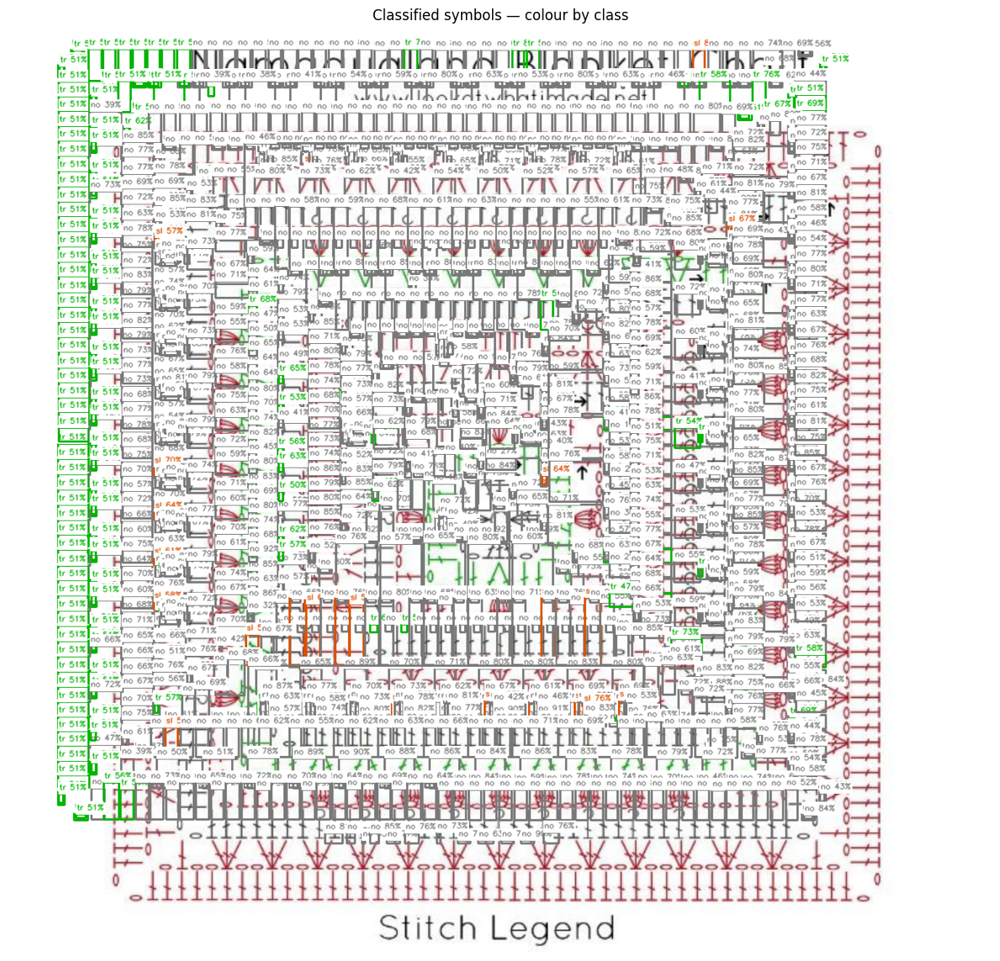

In [18]:
# Draw classification labels on the original image
# Each stitch gets a bounding box + label above it, colour-coded by class
CLASS_COLORS = {
    "treble":      (0,   180,  0),    # green
    "slip_stitch": (220,  80,  0),    # orange
    "chain":       (0,   100, 220),   # blue
    "double":      (180,   0, 180),   # purple
}
DEFAULT_COLOR = (120, 120, 120)       # grey for unknown classes

annotated = cv.cvtColor(img.copy(), cv.COLOR_BGR2RGB)

for s in classified:
    x, y, w, h = s.bbox
    color = CLASS_COLORS.get(s.label, DEFAULT_COLOR)

    # Bounding box
    cv.rectangle(annotated, (x, y), (x + w, y + h), color, 2)

    # Short label abbreviation so it fits over small symbols
    abbrev = {
        "treble":      "tr",
        "slip_stitch": "sl",
        "chain":       "ch",
        "double":      "dc",
    }.get(s.label, s.label[:2])

    label_text = f"{abbrev} {s.confidence:.0%}"

    # White background pill so the text is readable over any image
    (tw, th), baseline = cv.getTextSize(label_text, cv.FONT_HERSHEY_SIMPLEX, 0.35, 1)
    cv.rectangle(annotated, (x, y - th - baseline - 4), (x + tw + 2, y), (255, 255, 255), -1)
    cv.putText(annotated, label_text, (x + 1, y - baseline - 2),
               cv.FONT_HERSHEY_SIMPLEX, 0.35, color, 1, cv.LINE_AA)

plt.figure(figsize=(12, 12))
plt.imshow(annotated)
plt.title("Classified symbols — colour by class")
plt.axis("off")
plt.tight_layout()
plt.show()

In [19]:
import base64

# ── Per-class stroke colours (match the annotation cell) ──────────────────
SVG_COLORS = {
    "treble":      "#00b400",
    "slip_stitch": "#dc5000",
    "chain":       "#0064dc",
    "double":      "#b400b4",
}
DEFAULT_SVG_COLOR = "#787878"


def svg_symbol(stitch, cx, cy, w, h):
    """
    Return an SVG <g> string for one stitch, scaled to fit its bounding box.
    All symbols are designed on a unit canvas then scaled to (w, h).

    Standard crochet chart symbols:
      treble      — tall stem, two diagonal yarn-over bars, T-base
      double      — medium stem, one diagonal yarn-over bar, T-base
      slip_stitch — circle (open ring)
      chain       — horizontal ellipse
    """
    color  = SVG_COLORS.get(stitch, DEFAULT_SVG_COLOR)
    sw     = max(1.0, min(w, h) * 0.07)   # stroke width scales with symbol size
    stroke = f'stroke="{color}" stroke-width="{sw:.2f}" stroke-linecap="round" fill="none"'

    if stitch == "treble":
        # Design space: width=10, height=40  (centred at 0,0)
        sx, sy = w / 10, h / 40
        return (
            f'<g transform="translate({cx},{cy})">'
            # stem
            f'<line x1="0" y1="{-h/2:.1f}" x2="0" y2="{h/2:.1f}" {stroke}/>'
            # two yarn-over bars (diagonal ticks)
            f'<line x1="{-w*0.45:.1f}" y1="{-h*0.22:.1f}" x2="{w*0.45:.1f}" y2="{-h*0.08:.1f}" {stroke}/>'
            f'<line x1="{-w*0.45:.1f}" y1="{h*0.05:.1f}"  x2="{w*0.45:.1f}" y2="{h*0.19:.1f}"  {stroke}/>'
            # T-base
            f'<line x1="{-w*0.4:.1f}" y1="{h/2:.1f}" x2="{w*0.4:.1f}" y2="{h/2:.1f}" {stroke}/>'
            f'</g>'
        )

    elif stitch == "double":
        return (
            f'<g transform="translate({cx},{cy})">'
            # stem
            f'<line x1="0" y1="{-h/2:.1f}" x2="0" y2="{h/2:.1f}" {stroke}/>'
            # one yarn-over bar
            f'<line x1="{-w*0.45:.1f}" y1="{-h*0.12:.1f}" x2="{w*0.45:.1f}" y2="{h*0.04:.1f}" {stroke}/>'
            # T-base
            f'<line x1="{-w*0.4:.1f}" y1="{h/2:.1f}" x2="{w*0.4:.1f}" y2="{h/2:.1f}" {stroke}/>'
            f'</g>'
        )

    elif stitch == "slip_stitch":
        r = min(w, h) * 0.42
        return (
            f'<g transform="translate({cx},{cy})">'
            f'<circle cx="0" cy="0" r="{r:.1f}" {stroke}/>'
            f'<circle cx="0" cy="0" r="{r*0.22:.1f}" fill="{color}" stroke="none"/>'
            f'</g>'
        )

    elif stitch == "chain":
        rx, ry = w * 0.42, h * 0.42
        return (
            f'<g transform="translate({cx},{cy})">'
            f'<ellipse cx="0" cy="0" rx="{rx:.1f}" ry="{ry:.1f}" {stroke}/>'
            f'</g>'
        )

    else:  # unknown — grey square
        return (
            f'<rect x="{cx - w/2:.1f}" y="{cy - h/2:.1f}" '
            f'width="{w}" height="{h}" fill="none" stroke="{DEFAULT_SVG_COLOR}" stroke-width="1"/>'
        )


def build_svg(classified_symbols, img_w, img_h,
              background_img_path=None, img_opacity=0.35):
    """
    Build a complete SVG string.

    If background_img_path is given, the PNG is embedded as a semi-transparent
    background so you can compare SVG symbols against the original scheme.
    """
    parts = [
        f'<svg xmlns="http://www.w3.org/2000/svg" '
        f'width="{img_w}" height="{img_h}" '
        f'viewBox="0 0 {img_w} {img_h}">'
    ]

    # Background
    if background_img_path:
        with open(background_img_path, "rb") as f:
            b64 = base64.b64encode(f.read()).decode()
        parts.append(
            f'<image href="data:image/png;base64,{b64}" '
            f'x="0" y="0" width="{img_w}" height="{img_h}" '
            f'opacity="{img_opacity}"/>'
        )
    else:
        parts.append(f'<rect width="{img_w}" height="{img_h}" fill="white"/>')

    # Symbols
    parts.append('<g id="symbols">')
    for s in classified_symbols:
        x, y, w, h = s.bbox
        cx = x + w / 2
        cy = y + h / 2
        parts.append(svg_symbol(s.label, cx, cy, w, h))
    parts.append('</g>')

    # Legend
    legend_x, legend_y = 8, img_h - 10
    legend_items = list(SVG_COLORS.items())
    for i, (label, color) in enumerate(legend_items):
        lx = legend_x + i * 110
        parts.append(
            f'<rect x="{lx}" y="{legend_y - 10}" width="12" height="12" '
            f'fill="{color}" rx="2"/>'
            f'<text x="{lx + 16}" y="{legend_y}" '
            f'font-family="sans-serif" font-size="10" fill="#333">{label}</text>'
        )

    parts.append('</svg>')
    return "\n".join(parts)


print("SVG builder ready.")

SVG builder ready.


SVGs saved: scheme_overlay.svg  |  scheme_standalone.svg



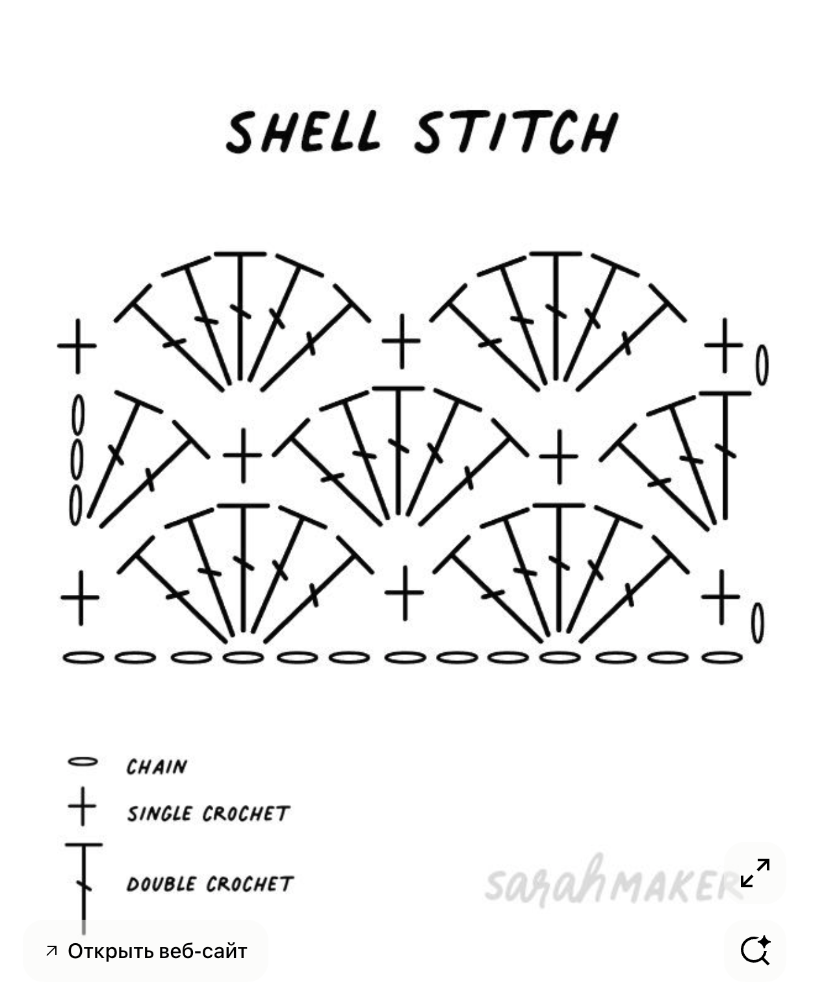

In [20]:
from IPython.display import SVG, display, HTML

img_h, img_w = img.shape[:2]
IMG_PATH = "data/raw/easy/39.png"

# ── 1. Overlay: SVG symbols drawn on top of the faded original image ─────────
overlay_svg = build_svg(classified, img_w, img_h,
                        background_img_path=IMG_PATH, img_opacity=0.35)

with open("scheme_overlay.svg", "w") as f:
    f.write(overlay_svg)

# ── 2. Standalone: same symbol positions, clean white background ──────────────
standalone_svg = build_svg(classified, img_w, img_h,
                           background_img_path=None)

with open("scheme_standalone.svg", "w") as f:
    f.write(standalone_svg)

print("SVGs saved: scheme_overlay.svg  |  scheme_standalone.svg")

# ── Display side-by-side in the notebook ─────────────────────────────────────
display(HTML(f"""
<div style="display:flex; gap:24px; align-items:flex-start;">
  <div>
    <p style="font-family:sans-serif; font-size:13px; margin-bottom:6px;">
      <b>Overlay</b> — SVG symbols on original image
    </p>
    {overlay_svg}
  </div>
  <div>
    <p style="font-family:sans-serif; font-size:13px; margin-bottom:6px;">
      <b>Standalone</b> — clean SVG scheme
    </p>
    {standalone_svg}
  </div>
</div>
"""))

In [21]:
import os

output_dir = "data/segments/unlabeled"
os.makedirs(output_dir, exist_ok=True)

PADDING = 4  # pixels of padding around each symbol

for i, c in enumerate(contours):
    x, y, w, h = cv.boundingRect(c)
    # Add padding, clamped to image bounds
    x1 = max(x - PADDING, 0)
    y1 = max(y - PADDING, 0)
    x2 = min(x + w + PADDING, gray_img.shape[1])
    y2 = min(y + h + PADDING, gray_img.shape[0])
    
    crop = gray_img[y1:y2, x1:x2]
    cv.imwrite(f"{output_dir}/symbol_{i:04d}.png", crop)

print(f"Saved {len(contours)} crops to {output_dir}/")

Saved 1786 crops to data/segments/unlabeled/
